In [2]:
import fitting
import multiprocessing as mp
from importlib import reload

In [3]:
import matplotlib as mpl
import matplotlib.pyplot as plt 
from matplotlib import rcParams

rcParams['axes.labelsize']=15.
rcParams['xtick.labelsize'] = 12.
rcParams['ytick.labelsize'] = 12.

Fitting.


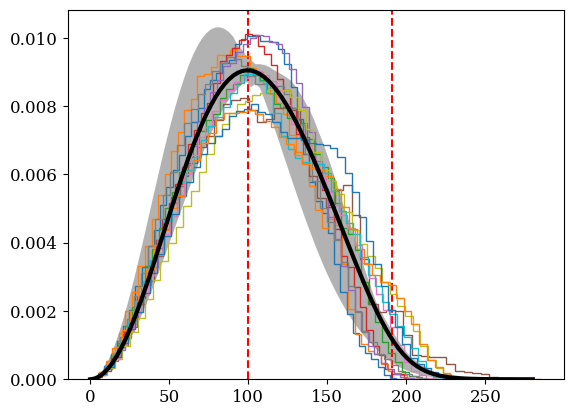

In [24]:
reload(fitting)
fitting.find_uncertainty('discs', v0char=100., 
                         ddfrac=0.1579, dhfrac=0.0263, 
                         N_samples=20, assume_corr=True)

# Individual

## Individual, no correlation

### Individual, no correlation, area unconstrained

In [46]:
reload(fitting)
result_indv_nocorr_noarea = fitting.find_68_uncertainty(
     'brute', 
     assume_corr=False, 
     diff_fcn=fitting.diff_fr68,
     incl_area=False,
     workers=10)
result_indv_nocorr_noarea

7min, 2.1s taken to optimize.


chi2 = 4.0224e-05


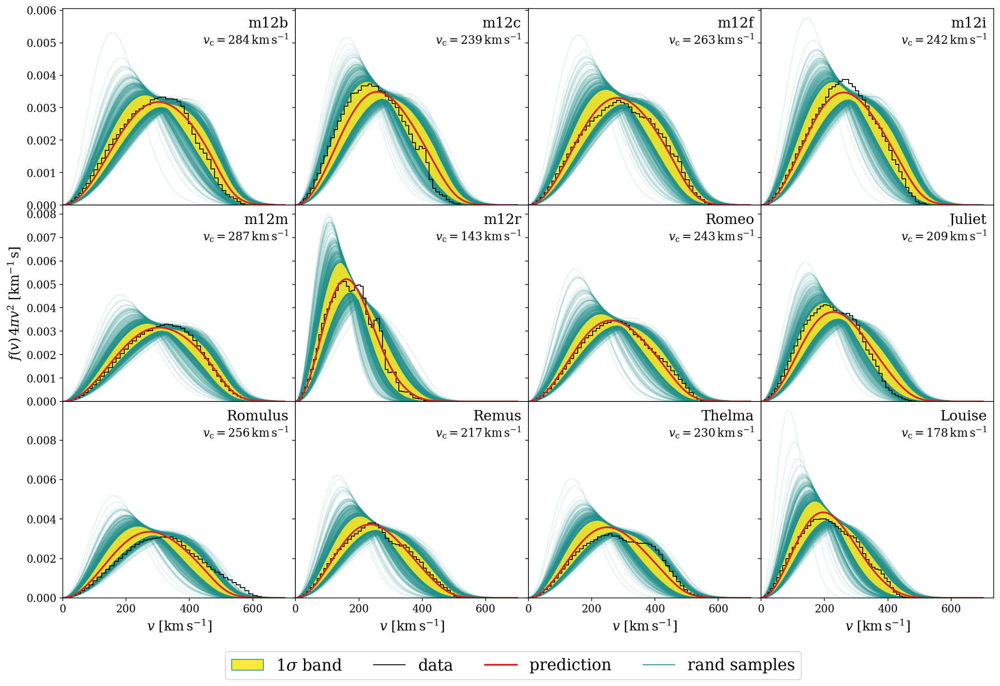

In [47]:
_ = fitting.plt_universal(gals='discs', update_values=False, 
                          tgt_fname=None, method='leastsq',
                          fit_kws=dict(), vc100=True, err_method='sampling',
                          ddfrac=0.13157895, dhfrac=0.02631579, 
                          assume_corr=False, 
                          band_alpha=0.9,
                          band_color=plt.cm.viridis(1.),
                          data_color='k')

### Individual, no correlation, area constrained

In [66]:
reload(fitting)
result_indv_nocorr_area = fitting.find_68_uncertainty(
     'brute', 
     assume_corr=False, 
     diff_fcn=fitting.diff_fr68,
     incl_area=True,
     workers=10, Ns=25)
result_indv_nocorr_area

7min, 1.1s taken to optimize.


chi2 = 4.022e-05


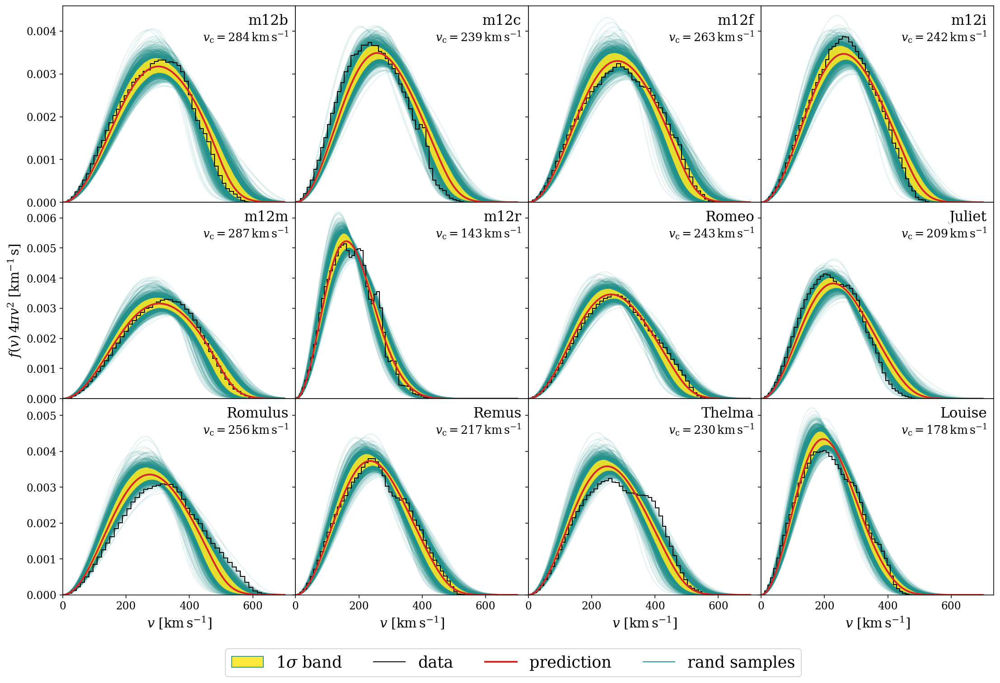

In [31]:
reload(fitting)
_ = fitting.plt_universal(gals='discs', update_values=False, 
                          tgt_fname=None, method='leastsq',
                          fit_kws=dict(), vc100=True, err_method='sampling',
                          ddfrac=0.05263158, dhfrac=0.07894737, 
                          assume_corr=False, 
                          band_alpha=0.9,
                          band_color=plt.cm.viridis(1.),
                          data_color='k')

## Individual, correlation assumed

In [7]:
reload(fitting)
fitting.find_68_uncertainty('brute', assume_corr=True, 
                            diff_fcn=fitting.diff_fr68, workers=10)

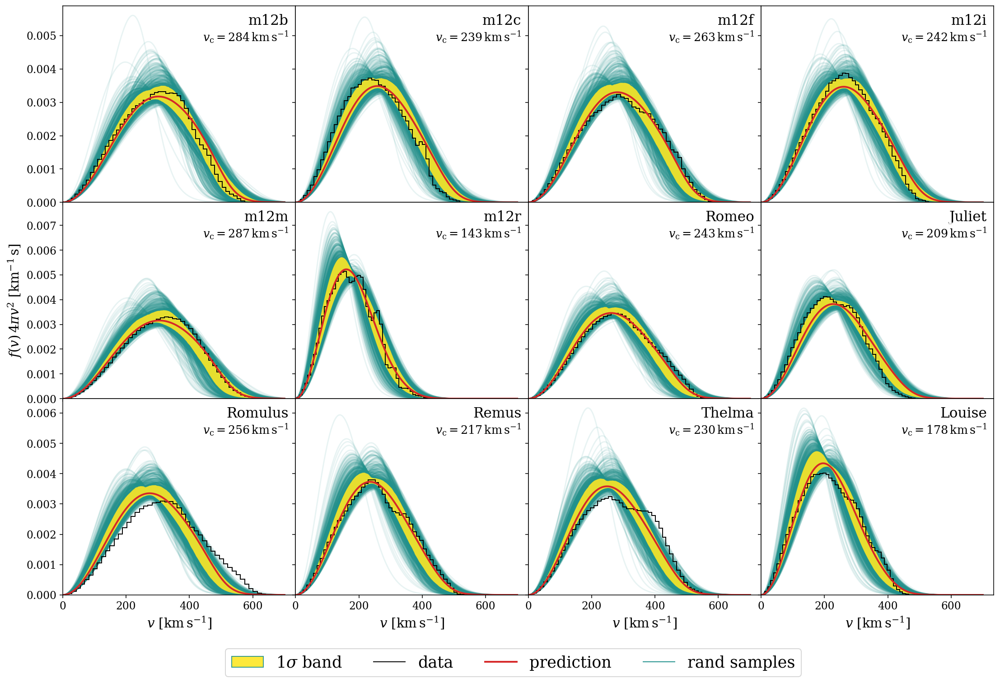

In [16]:
_ = fitting.plt_universal(gals='discs', update_values=False, 
                          tgt_fname=None, method='leastsq',
                          fit_kws=dict(), vc100=True, err_method='sampling',
                          ddfrac=0.21052632, dhfrac=0.02631579, 
                          assume_corr=True,
                          band_alpha=0.9,
                          data_color='k', band_color=plt.cm.viridis(1.))

# Aggregate

## Aggregate, no correlation

### Aggreate, no correlation, area constrained

In [36]:
reload(fitting)
fitting.find_68_uncertainty('brute', assume_corr=False, 
                            diff_fcn=fitting.diff_fr68_agg,
                            incl_area=True,
                            verbose=False, workers=10)

6min, 55.1s taken to optimize.


In [135]:
params_ = lmfit.Parameters()
params_.add('ddfrac', value=0.07894737)
params_.add('dhfrac', value=0.10526316)

fitting.diff_fr68_agg(params_, pdfs_, 
                      dm_den.load_data('dm_stats_20221208.h5'),
                      assume_corr=True,
                      incl_area=True,
                      verbose=True)

ddfrac = 0.0789, dhfrac = 0.1053, SSE = 2.201e-03, frac within = 0.7050, area = 0.0413


array([0.02231051, 0.04127134])

chi2 = 4.0224e-05


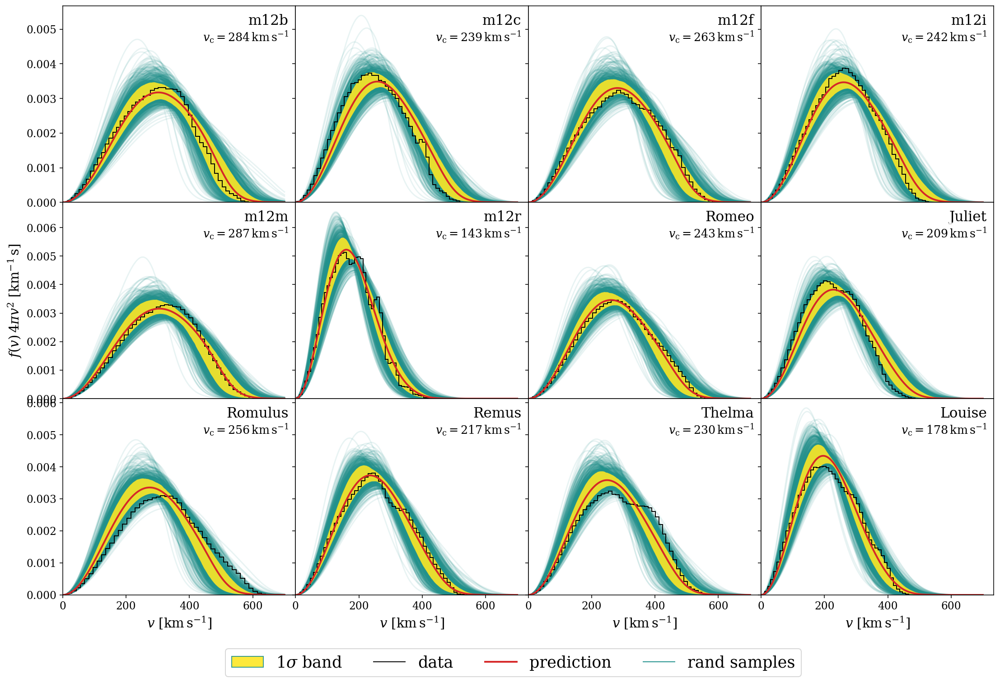

In [41]:
reload(fitting)
_ = fitting.plt_universal(gals='discs', update_values=False, 
                          tgt_fname=None, method='leastsq',
                          fit_kws=dict(), vc100=True, err_method='sampling',
                          ddfrac=0.07894737, dhfrac=0.10526316, 
                          assume_corr=False,
                          band_alpha=0.9,
                          data_color='k', band_color=plt.cm.viridis(1.))

### Aggregate, no correlation, area unconstrained

In [53]:
reload(fitting)
result_agg_nocorr_noarea = fitting.find_68_uncertainty(
    'brute', 
    assume_corr=False, 
    incl_area=False,
    diff_fcn=fitting.diff_fr68_agg,
    verbose=False, workers=10)

6min, 55.8s taken to optimize.


In [56]:
result_agg_nocorr_noarea

In [101]:
isd = np.isclose(result_agg_nocorr_noarea.brute_grid[0], 0.0263,
                 atol=0.0001)
ish = np.isclose(result_agg_nocorr_noarea.brute_grid[1], 0.2632, atol=1.e-4)
print(result_agg_nocorr_noarea.brute_grid[:,isd & ish])
print(result_agg_nocorr_noarea.brute_Jout[isd & ish])

isd = np.isclose(result_agg_nocorr_noarea.brute_grid[0], 0., atol=0.0001)
ish = np.isclose(result_agg_nocorr_noarea.brute_grid[1], 0.31578947, atol=1.e-4)
print(result_agg_nocorr_noarea.brute_grid[:,isd & ish])
print(result_agg_nocorr_noarea.brute_Jout[isd & ish])

[[0.02631579]
 [0.26315789]]
[1.58179172e-05]
[[0.        ]
 [0.31578947]]
[4.14531486e-07]


In [131]:
import copy
import lmfit
params_ = lmfit.Parameters()
params_.add('ddfrac', value=0.02631579)
params_.add('dhfrac', value=0.26315789)
pdfs_ = copy.deepcopy(fitting.pdfs_v)
del pdfs_['m12w']
del pdfs_['m12z']
reload(fitting)
fitting.diff_fr68_agg(result_agg_nocorr_noarea.params, pdfs_, 
                      dm_den.load_data('dm_stats_20221208.h5'),
                      assume_corr=False,
                      incl_area=False,
                      verbose=True)
fitting.diff_fr68_agg(params_, pdfs_, 
                      dm_den.load_data('dm_stats_20221208.h5'),
                      assume_corr=False,
                      incl_area=False,
                      verbose=True)

ddfrac = 0.0000, dhfrac = 0.3158, SSE = 5.338e-06, frac within = 0.6850, area = 0.0469
ddfrac = 0.0263, dhfrac = 0.2632, SSE = 3.185e-05, frac within = 0.6883, area = 0.0395


3.185294344846042e-05

chi2 = 4.0224e-05


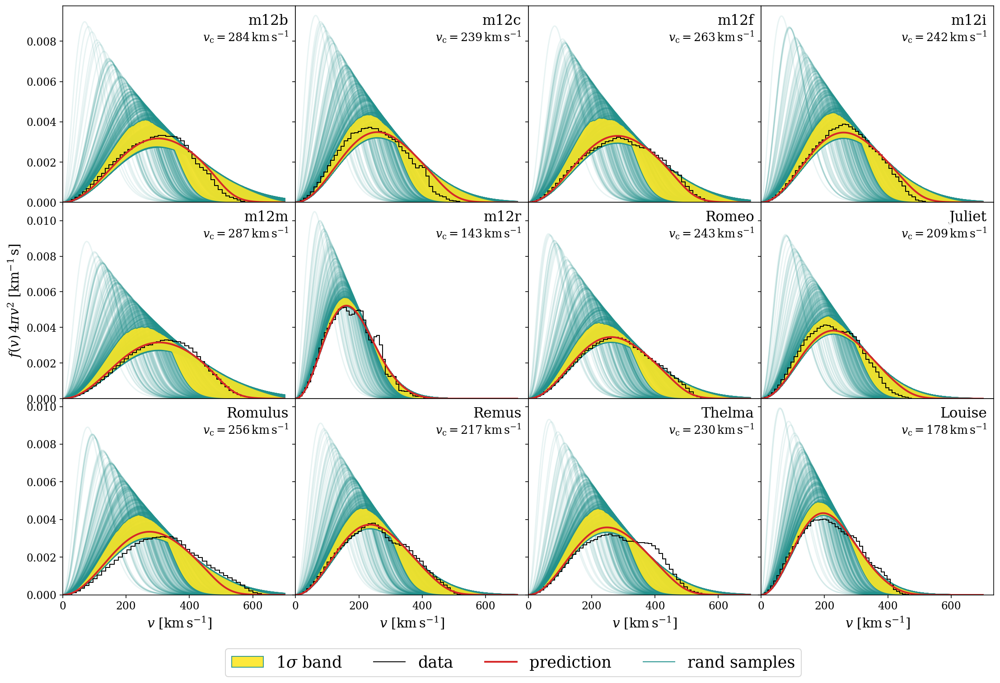

In [57]:
_ = fitting.plt_universal(gals='discs', update_values=False, 
                          tgt_fname=None, method='leastsq',
                          fit_kws=dict(), vc100=True, err_method='sampling',
                          ddfrac=0., dhfrac=0.31578947, 
                          assume_corr=False,
                          band_alpha=0.9,
                          data_color='k', band_color=plt.cm.viridis(1.))

### From my grid search

In [193]:
params_ = lmfit.Parameters()
params_.add('ddfrac', value=0.075)
params_.add('dhfrac', value=0.13125)

PARAMS = [params_]*10

In [214]:
reload(fitting)
pool = mp.Pool(10)
pool.map(fitting.diff_fr68_agg,
         PARAMS)

ddfrac = 0.0750, dhfrac = 0.1313, SSE = 1.000e-03, frac within = 0.6883, area = 0.0311
ddfrac = 0.0750, dhfrac = 0.1313, SSE = 9.851e-04, frac within = 0.6817, area = 0.0314
ddfrac = 0.0750, dhfrac = 0.1313, SSE = 9.865e-04, frac within = 0.6850, area = 0.0313
ddfrac = 0.0750, dhfrac = 0.1313, SSE = 9.725e-04, frac within = 0.6850, area = 0.0311
ddfrac = 0.0750, dhfrac = 0.1313, SSE = 1.065e-03, frac within = 0.6733, area = 0.0313
ddfrac = 0.0750, dhfrac = 0.1313, SSE = 9.779e-04, frac within = 0.6800, area = 0.0312
ddfrac = 0.0750, dhfrac = 0.1313, SSE = 9.844e-04, frac within = 0.6833, area = 0.0314
ddfrac = 0.0750, dhfrac = 0.1313, SSE = 9.974e-04, frac within = 0.6767, area = 0.0310
ddfrac = 0.0750, dhfrac = 0.1313, SSE = 1.010e-03, frac within = 0.6867, area = 0.0315
ddfrac = 0.0750, dhfrac = 0.1313, SSE = 1.000e-03, frac within = 0.6867, area = 0.0314


[array([-0.00602283,  0.03118587]),
 array([0.00231051, 0.03121344]),
 array([-0.00602283,  0.03098857]),
 array([-0.00102283,  0.03126666]),
 array([-0.00102283,  0.03123969]),
 array([0.01064384, 0.03130629]),
 array([0.00231051, 0.03136781]),
 array([0.01397717, 0.03117581]),
 array([0.00231051, 0.03133261]),
 array([0.00564384, 0.03129673])]

Using ddfrac = 0.07500
Using dhfrac = 0.13125


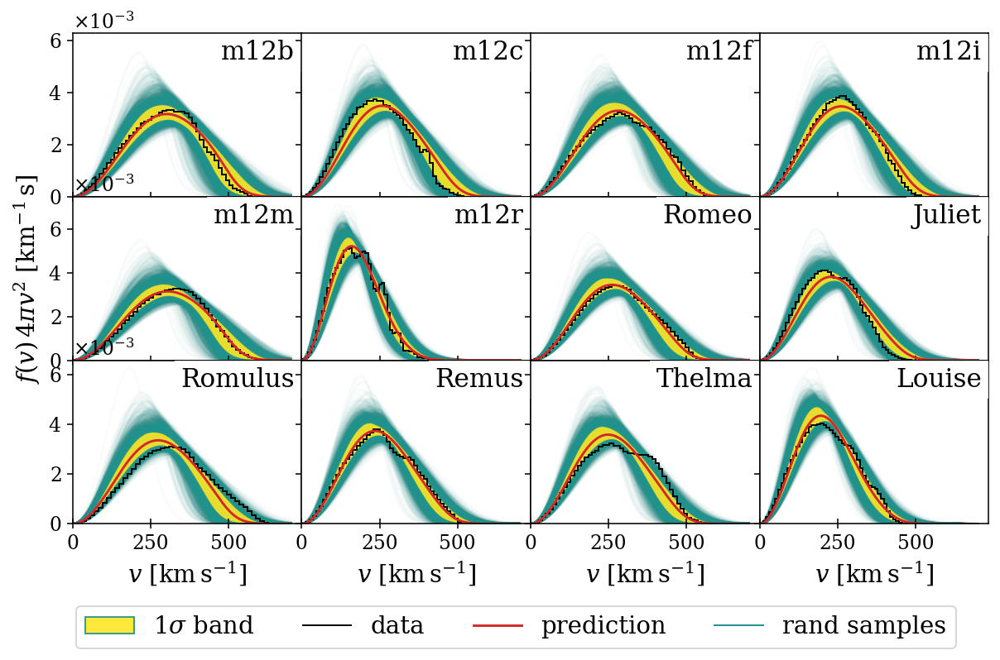

In [223]:
reload(fitting)
_ = fitting.plt_universal(gals='discs', update_values=True, 
                          tgt_fname=None, method='leastsq',
                          fit_kws=dict(), vc100=True, err_method='sampling', 
                          assume_corr=False,
                          band_alpha=0.9,
                          data_color='k', band_color=plt.cm.viridis(1.))

In [184]:
params_ = lmfit.Parameters()
params_.add('ddfrac', value=0.2225)
params_.add('dhfrac', value=0.03833333)
fitting.diff_fr68_agg(params_, assume_corr=False,
                      incl_area=True,
                      verbose=True)

ddfrac = 0.2225, dhfrac = 0.0383, SSE = 5.443e-02, frac within = 0.9067, area = 0.0653


array([0.22397717, 0.06530138])

chi2 = 4.0224e-05


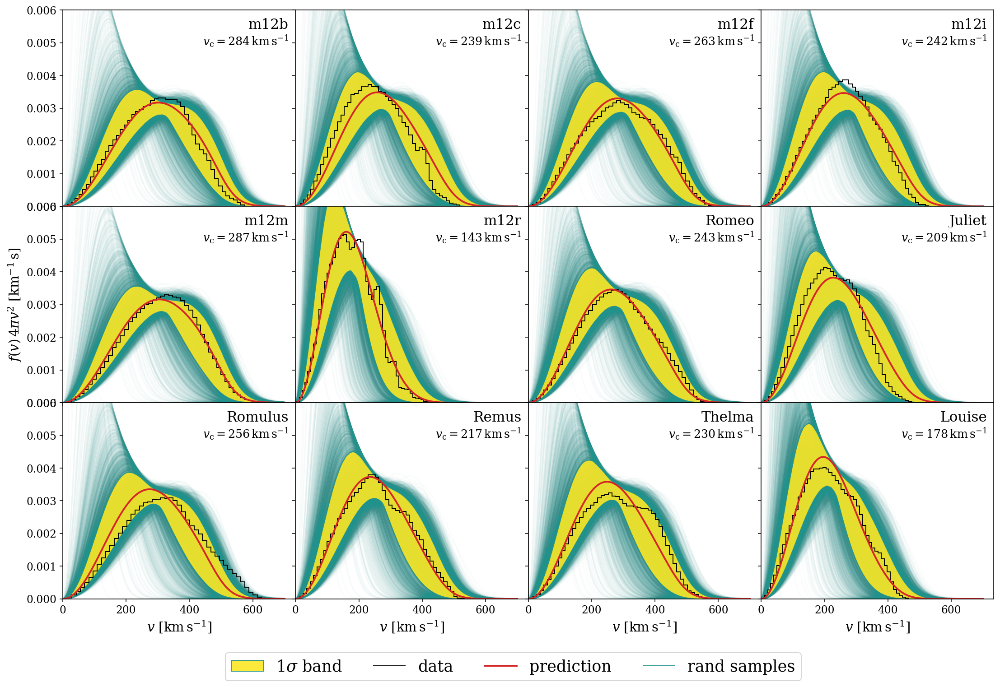

In [188]:
reload(fitting)
_ = fitting.plt_universal(gals='discs', update_values=False, 
                          tgt_fname=None, method='leastsq',
                          fit_kws=dict(), vc100=True, err_method='sampling',
                          ddfrac=0.2225, dhfrac=0.03833333, 
                          assume_corr=False,
                          band_alpha=0.9,
                          data_color='k', band_color=plt.cm.viridis(1.),
                          ymax=0.006)

## Aggregate, correlation assumed

### Aggregate, correlated, area constrained

In [ ]:
reload(fitting)
fitting.find_68_uncertainty('brute', assume_corr=True, 
                            diff_fcn=fitting.diff_fr68_agg,
                            verbose=True, workers=10)

#### Testing things

In [134]:
params_ = lmfit.Parameters()
params_.add('ddfrac', value=0.31578947)
params_.add('dhfrac', value=0.02631579)
reload(fitting)
fitting.diff_fr68_agg(params_, pdfs_, 
                      dm_den.load_data('dm_stats_20221208.h5'),
                      assume_corr=True,
                      incl_area=True,
                      verbose=True)

params_['ddfrac'].set(value=0.)
params_['dhfrac'].set(value=0.4474)
fitting.diff_fr68_agg(params_, pdfs_, 
                      dm_den.load_data('dm_stats_20221208.h5'),
                      assume_corr=True,
                      incl_area=True,
                      verbose=True)

ddfrac = 0.3158, dhfrac = 0.0263, SSE = 1.392e-03, frac within = 0.6833, area = 0.0373
ddfrac = 0.0000, dhfrac = 0.4474, SSE = 2.519e-02, frac within = 0.6850, area = 0.1587


array([0.00231051, 0.15868754])

chi2 = 4.0224e-05


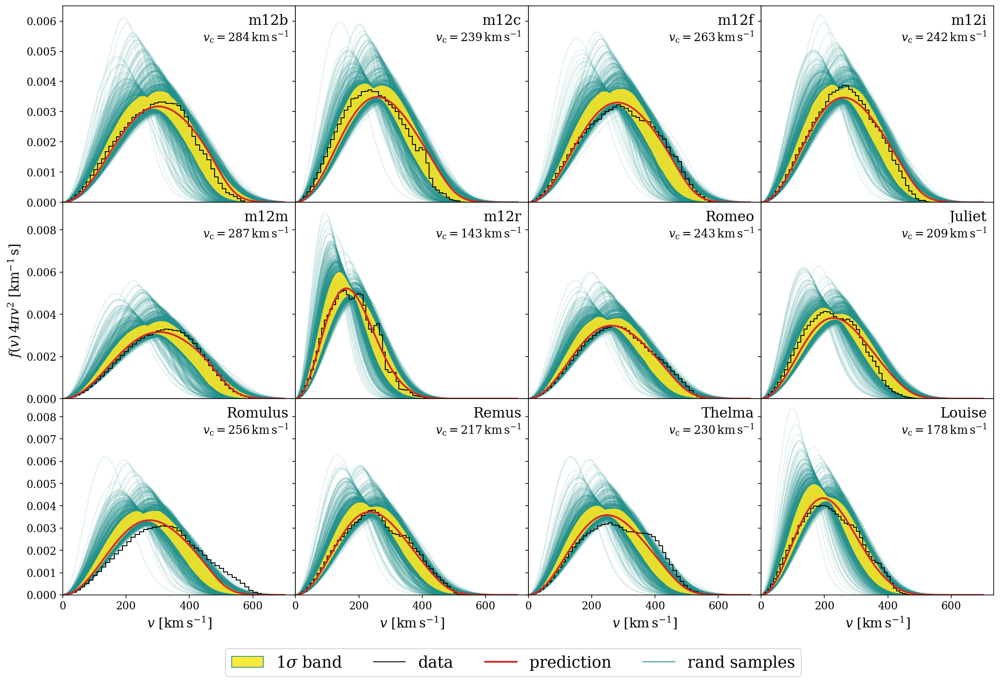

In [39]:
reload(fitting)
_ = fitting.plt_universal(gals='discs', update_values=False, 
                          tgt_fname=None, method='leastsq',
                          fit_kws=dict(), vc100=True, err_method='sampling',
                          ddfrac=0.31578947, dhfrac=0.02631579, 
                          assume_corr=True,
                          band_alpha=0.9,
                          data_color='k', band_color=plt.cm.viridis(1.))

### Aggregate, correlated, area unconstrained

In [ ]:
reload(fitting)
result_agg_corr_noarea = fitting.find_68_uncertainty(
     'brute', 
     assume_corr=True, 
     diff_fcn=fitting.diff_fr68_agg,
     incl_area=False,
     workers=10, Ns=25)

In [138]:
result_agg_corr_noarea

In [141]:
fitting.diff_fr68_agg(result_agg_corr_noarea.params, pdfs_, 
                      dm_den.load_data('dm_stats_20221208.h5'),
                      assume_corr=True,
                      incl_area=True,
                      verbose=True)

ddfrac = 0.0208, dhfrac = 0.5000, SSE = 2.478e-02, frac within = 0.6800, area = 0.1574


array([-0.00268949,  0.15739301])

chi2 = 4.0224e-05


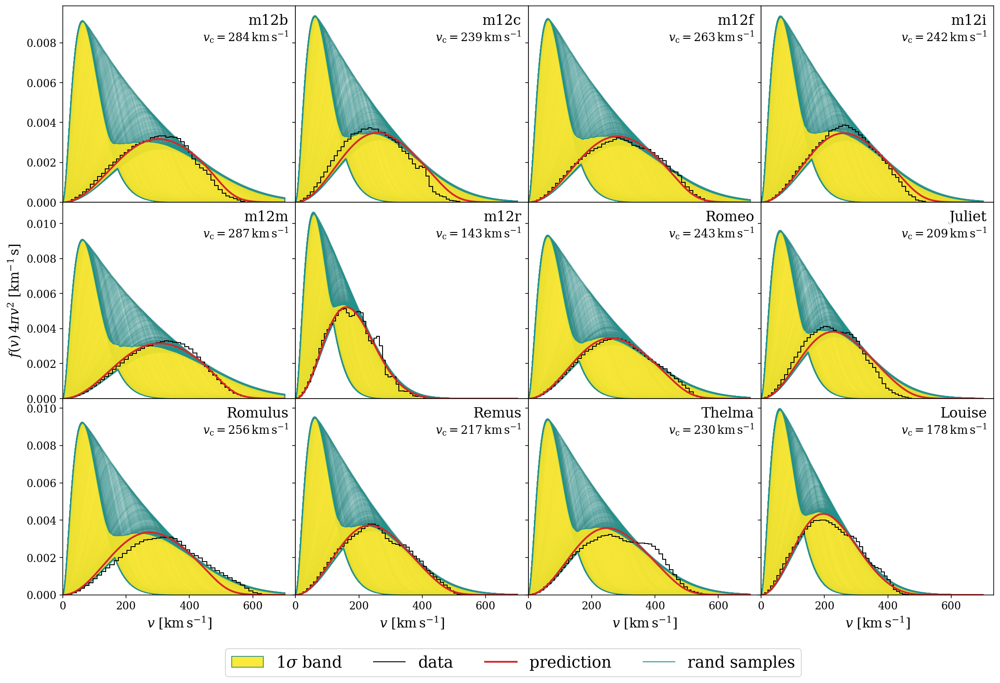

In [215]:
reload(fitting)
_ = fitting.plt_universal(gals='discs', update_values=False, 
                          tgt_fname=None, method='leastsq',
                          fit_kws=dict(), vc100=True, err_method='sampling',
                          ddfrac=result_agg_corr_noarea.params['ddfrac'].value,
                          dhfrac=result_agg_corr_noarea.params['dhfrac'].value, 
                          assume_corr=True,
                          band_alpha=0.9,
                          data_color='k', band_color=plt.cm.viridis(1.))